In [2]:
import gdown
import tensorflow as tf
import keras
from keras.models import Sequential
from keras import layers
from keras import applications
from keras import optimizers
from keras.applications import EfficientNetB0
from keras.models import Model
from keras.metrics import Precision, Recall
from keras.callbacks import TensorBoard
from keras.utils import load_img, img_to_array
from keras.metrics import CategoricalAccuracy, TopKCategoricalAccuracy
from keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, Input
import matplotlib.pyplot as plt
import numpy as np

## Conseguir y preparar dataset

In [3]:
# Dataset
poke_id = '1BQOodOsnStcMwdF1xIA41_i7tNNvRbYK'
poke_url = f'https://drive.google.com/uc?id={poke_id}'
gdown.download(poke_url, 'pokemondataset.zip', quiet = True)

'pokemondataset.zip'

In [4]:
# Demonstration
demo_id = '1AEHHy1qQFASKTgQHofyHbFJmYCkPXGZr'
demo_url = f'https://drive.google.com/uc?id={demo_id}'
gdown.download(demo_url, 'demonstration.zip', quiet = True)

'demonstration.zip'

In [7]:
!unzip 'pokemondataset.zip'
!rm -rf 'pokemondataset.zip'
!unzip 'demonstration.zip'
!rm -rf 'demonstration.zip'

Archive:  pokemondataset.zip
   creating: pokemondataset/
   creating: pokemondataset/Abra/
  inflating: pokemondataset/Abra/00000000_png.rf.6e5b75c0ed95044d9d4be7f1c2081e20.jpg  
  inflating: pokemondataset/Abra/00000000_png.rf.92c13d76483cebb0bd3828fd0faabc0c.jpg  
  inflating: pokemondataset/Abra/00000000_png.rf.9a4f54c15bdeff12fb9fe56b90f7c0ad.jpg  
  inflating: pokemondataset/Abra/00000001_png.rf.0640b9627b6af180e103514308aa7865.jpg  
  inflating: pokemondataset/Abra/00000001_png.rf.e5bfa9775663e0b5c7a8b421a8e44bc3.jpg  
  inflating: pokemondataset/Abra/00000001_png.rf.e7fb7f72b728652555b7631d0104cef6.jpg  
  inflating: pokemondataset/Abra/00000003_png.rf.9cc2f8c8d68c24e6d633c415e93caace.jpg  
  inflating: pokemondataset/Abra/00000004_png.rf.e6d2e246f7e0766848e817f03cf55438.jpg  
  inflating: pokemondataset/Abra/00000006_png.rf.56686b8a50dda16b6ae65b0f722bcc87.jpg  
  inflating: pokemondataset/Abra/00000006_png.rf.949632568267dacac45f7514fcbc4920.jpg  
  inflating: pokemondataset/

In [8]:
DATASET_DIRECTORY = 'pokemondataset'
IMAGE_SIZE = (224,224)
BATCH_SIZE = 16
SHUFFLE = True
VALIDATION_SPLIT = 0.2

train_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    subset = 'training',
    validation_split = VALIDATION_SPLIT,
    seed = 123,
    shuffle = SHUFFLE
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    subset = 'validation',
    validation_split = VALIDATION_SPLIT,
    seed = 123,
    shuffle = False
)

Found 45036 files belonging to 151 classes.
Using 36029 files for training.


E0000 00:00:1766386892.114102 1623748 cuda_executor.cc:1309] INTERNAL: CUDA Runtime error: Failed call to cudaGetRuntimeVersion: Error loading CUDA libraries. GPU will not be used.: Error loading CUDA libraries. GPU will not be used.
W0000 00:00:1766386892.138792 1623748 gpu_device.cc:2342] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Found 45036 files belonging to 151 classes.
Using 9007 files for validation.


(16, 224, 224, 3)
(16, 151)


2025-12-22 04:02:13.497873: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


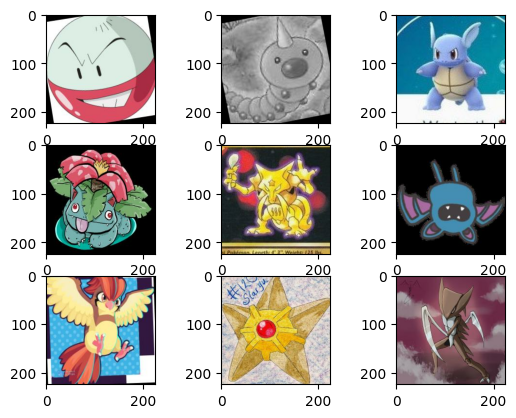

In [9]:
from numpy import astype
for images, labels in train_ds.take(1):
  print(images.shape)
  print(labels.shape)

  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

#VGG16

In [10]:
import tensorflow as tf
from keras.applications import VGG16

IMG_SHAPE = IMAGE_SIZE + (3,)
inputs = layers.Input(shape=IMG_SHAPE)

# VGG16
base_model = VGG16(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False

# Construcción de la cabeza del modelo
x = base_model(inputs, training=False)

x = GlobalMaxPooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
outputs = layers.Dense(151, activation='softmax')(x)

# Definición del Modelo
model_VGG16 = Model(inputs, outputs, name='Pokemon_VGG16')

model_VGG16.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.Adam(learning_rate=1e-4),
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

model_VGG16.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "Pokemon_VGG16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 512)            │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 151)            │        77,463 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,054,807 (57.43 MB)

 Trainable params: 340,119 (1.30 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [11]:
history_VGG16 = model_VGG16.fit(
    train_ds,
    epochs=10,
    validation_data=validation_ds
)

Epoch 1/10
 308/2252 ━━━━━━━━━━━━━━━━━━━━ 30:02 927ms/step - acc: 0.0091 - loss: 69.4645 - top3: 0.0255

KeyboardInterrupt: 

#EfficientNetB0

In [ ]:
# Definir la entrada
inputs = Input(shape=IMG_SHAPE)

base_model = EfficientNetB0(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

# Congelar el modelo
base_model.trainable = False

x = base_model(inputs, training=False)
x = GlobalMaxPooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(151, activation='softmax')(x)

model_EfficientNetB0 =  tf.keras.Model(inputs, x, name='EfficientNetB0')

model_EfficientNetB0.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_EfficientNetB0.summary())

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d_1          │ (None, 1280)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 151)            │        77,463 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,782,906 (18.25 MB)

 Trainable params: 733,335 (2.80 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [ ]:
history_EfficientNetB0 = model_EfficientNetB0.fit(
    train_ds,
    epochs=10,
    validation_data=validation_ds
)

Epoch 1/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 129s 45ms/step - acc: 0.1100 - loss: 4.8660 - top3: 0.1838 - val_acc: 0.6749 - val_loss: 1.4727 - val_top3: 0.8088
Epoch 2/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 63s 28ms/step - acc: 0.5283 - loss: 1.9585 - top3: 0.7013 - val_acc: 0.8069 - val_loss: 0.8287 - val_top3: 0.8991
Epoch 3/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 62s 27ms/step - acc: 0.6750 - loss: 1.3112 - top3: 0.8210 - val_acc: 0.8648 - val_loss: 0.5798 - val_top3: 0.9370
Epoch 4/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 61s 27ms/step - acc: 0.7433 - loss: 0.9993 - top3: 0.8737 - val_acc: 0.8947 - val_loss: 0.4421 - val_top3: 0.9560
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 62s 27ms/step - acc: 0.7849 - loss: 0.8141 - top3: 0.9033 - val_acc: 0.9144 - val_loss: 0.3600 - val_top3: 0.9647
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 62s 27ms/step - acc: 0.8178 - loss: 0.6771 - top3: 0.9229 - val_acc: 0.9302 - val_loss: 0.2903 - val_top3: 0.9732
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 60s 27ms/step - acc: 

#EfficientNetB0 - Fine Tuning

In [ ]:
from keras.applications import EfficientNetB0
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input


IMG_SHAPE = IMAGE_SIZE + (3,)

# Definir la entrada
inputs = Input(shape=IMG_SHAPE)

# Cargar el modelo base
base_model = EfficientNetB0(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

# Congelar el modelo
base_model.trainable = False

x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
outputs = Dense(151, activation='softmax')(x)

model_FineTuning = tf.keras.Model(inputs, outputs, name="Pokemon_Classifier")

# Compilación del modelo
model_FineTuning.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_FineTuning.summary())

Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 193,431 (755.59 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [ ]:
EPOCHS = 5

history_FineTuning = model_FineTuning.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=validation_ds
)

Epoch 1/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 107s 37ms/step - acc: 0.5174 - loss: 2.4364 - top3: 0.6499 - val_acc: 0.9020 - val_loss: 0.5252 - val_top3: 0.9575
Epoch 2/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 61s 27ms/step - acc: 0.8487 - loss: 0.6657 - top3: 0.9366 - val_acc: 0.9428 - val_loss: 0.3026 - val_top3: 0.9791
Epoch 3/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 82s 27ms/step - acc: 0.8844 - loss: 0.4729 - top3: 0.9596 - val_acc: 0.9553 - val_loss: 0.2323 - val_top3: 0.9872
Epoch 4/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 82s 27ms/step - acc: 0.9073 - loss: 0.3738 - top3: 0.9710 - val_acc: 0.9675 - val_loss: 0.1712 - val_top3: 0.9906
Epoch 5/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 62s 27ms/step - acc: 0.9193 - loss: 0.3139 - top3: 0.9770 - val_acc: 0.9750 - val_loss: 0.1327 - val_top3: 0.9936


In [ ]:
# Descongelar el modelo base
base_model.trainable = True

# Congelar todas las capas excepto las últimas ~30
# Esto deja la mayoría de los pesos de ImageNet intactos pero permite ajustes finos en las capas de características más altas.
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompilar el modelo
model_FineTuning.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy',
      TopKCategoricalAccuracy(k=3, name='top3')]
)

print(model_FineTuning.summary())

FINE_TUNE_EPOCHS = 5
TOTAL_EPOCHS = EPOCHS + FINE_TUNE_EPOCHS

history_Final = model_FineTuning.fit(
    train_ds,
    epochs=TOTAL_EPOCHS,
    initial_epoch=history_FineTuning.epoch[-1],
    validation_data=validation_ds
)

Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 1,689,591 (6.45 MB)

 Non-trainable params: 2,553,411 (9.74 MB)

None
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 132s 45ms/step - accuracy: 0.8793 - loss: 0.4677 - top3: 0.9580 - val_accuracy: 0.9869 - val_loss: 0.0633 - val_top3: 0.9966
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 74s 33ms/step - accuracy: 0.9502 - loss: 0.1844 - top3: 0.9891 - val_accuracy: 0.9901 - val_loss: 0.0400 - val_top3: 0.9981
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 74s 33ms/step - accuracy: 0.9696 - loss: 0.1200 - top3: 0.9951 - val_accuracy: 0.9948 - val_loss: 0.0243 - val_top3: 0.9989
Epoch 8/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 74s 33ms/step - accuracy: 0.9772 - loss: 0.0873 - top3: 0.9971 - val_accuracy: 0.9950 - val_loss: 0.0218 - val_top3: 0.9991
Epoch 9/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 91s 37ms/step - accuracy: 0.9830 - loss: 0.0657 - top3: 0.9984 - val_accuracy: 0.9943 - val_loss: 0.0209 - val_top3: 0.9990
Epoch 10/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 75s 33ms/step - accuracy: 0.9848 - loss: 0.0584 - top3: 0.9982 - val_accuracy: 0.9959 - val_loss: 0.0174 - val_top3: 0.99

#Pruebas


In [ ]:
!mkdir models

In [ ]:
model_VGG16.save('/content/models/pokemon_vgg16.keras')
model_FineTuning.save('/content/models/pokemon_finetuning.keras')
model_EfficientNetB0.save('/content/models/pokemon_efficientnetb0.keras')

In [ ]:
IMAGES_DIRECTORY = '/content/demonstration/'
IMAGE_SIZE = (224,224)
BATCH_SIZE = 16

self_ds = tf.keras.utils.image_dataset_from_directory(
    IMAGES_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    seed = 123,
    crop_to_aspect_ratio=True,
)

Found 20 files belonging to 10 classes.


In [ ]:
class_names = train_ds.class_names
class_names

['Abra',
 'Aerodactyl',
 'Alakazam',
 'Arbok',
 'Arcanine',
 'Articuno',
 'Beedrill',
 'Bellsprout',
 'Blastoise',
 'Bulbasaur',
 'Butterfree',
 'Caterpie',
 'Chansey',
 'Charizard',
 'Charmander',
 'Charmeleon',
 'Clefable',
 'Clefairy',
 'Cloyster',
 'Cubone',
 'Dewgong',
 'Diglett',
 'Ditto',
 'Dodrio',
 'Doduo',
 'Dragonair',
 'Dragonite',
 'Dratini',
 'Drowzee',
 'Dugtrio',
 'Eevee',
 'Ekans',
 'Electabuzz',
 'Electrode',
 'Exeggcute',
 'Exeggutor',
 'Farfetchd',
 'Fearow',
 'Flareon',
 'Gastly',
 'Gengar',
 'Geodude',
 'Gloom',
 'Golbat',
 'Goldeen',
 'Golduck',
 'Golem',
 'Graveler',
 'Grimer',
 'Growlithe',
 'Gyarados',
 'Haunter',
 'Hitmonchan',
 'Hitmonlee',
 'Horsea',
 'Hypno',
 'Ivysaur',
 'Jigglypuff',
 'Jolteon',
 'Jynx',
 'Kabuto',
 'Kabutops',
 'Kadabra',
 'Kakuna',
 'Kangaskhan',
 'Kingler',
 'Koffing',
 'Krabby',
 'Lapras',
 'Lickitung',
 'Machamp',
 'Machoke',
 'Machop',
 'Magikarp',
 'Magmar',
 'Magnemite',
 'Magneton',
 'Mankey',
 'Marowak',
 'Meowth',
 'Metapod',


Loading models from: /content/models/
Successfully loaded model: pokemon_efficientnetb0
Successfully loaded model: pokemon_finetuning
Successfully loaded model: pokemon_vgg16
Finished loading 3 models.

Processing images for class: Gengar


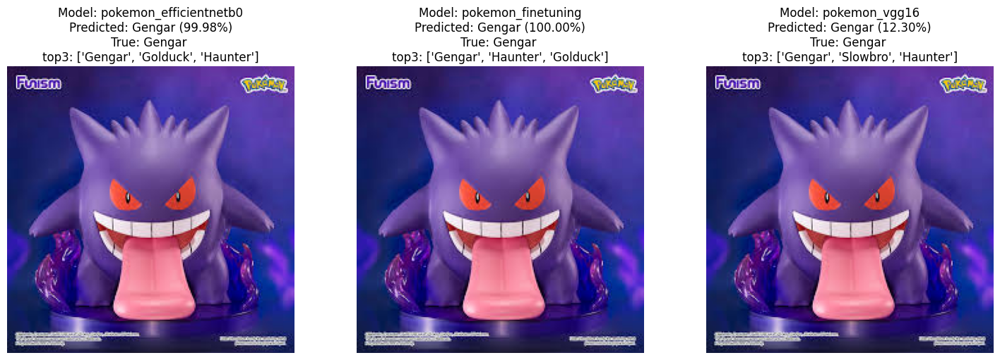

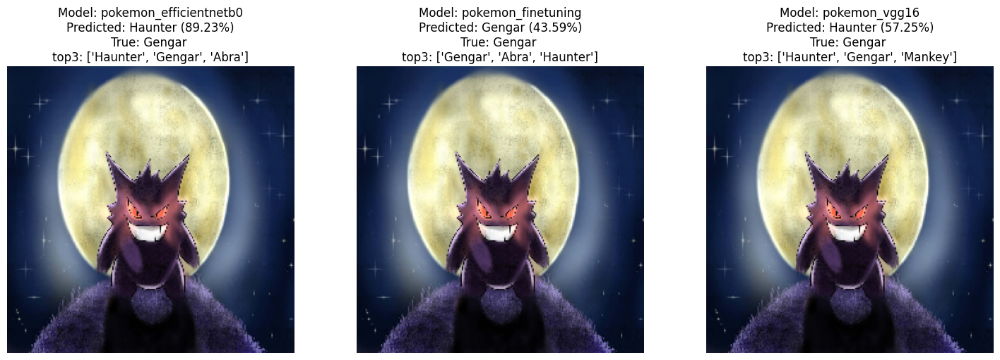


Processing images for class: Kabutops


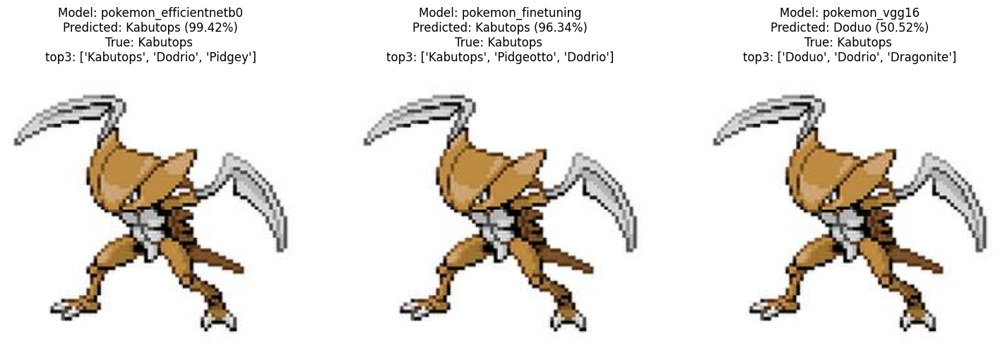

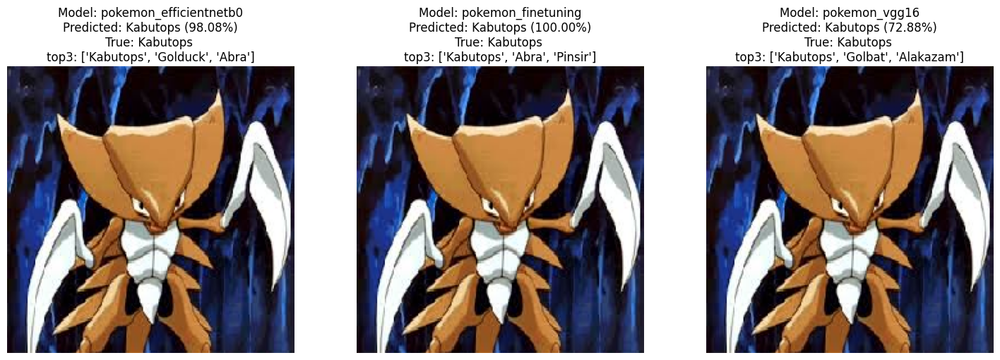


Processing images for class: Nidoking


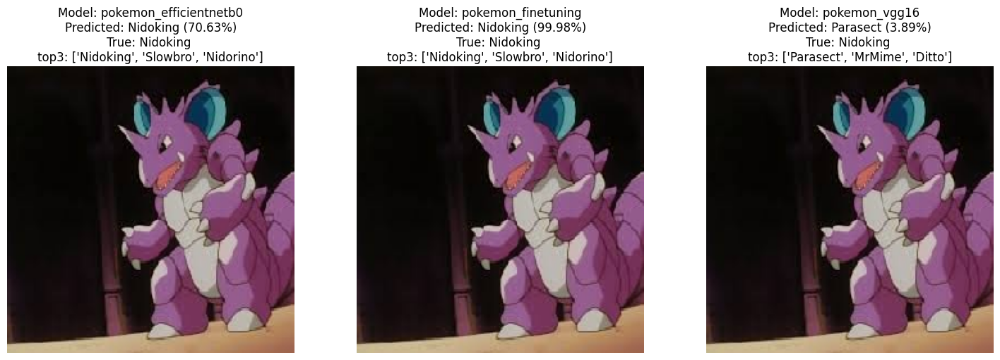

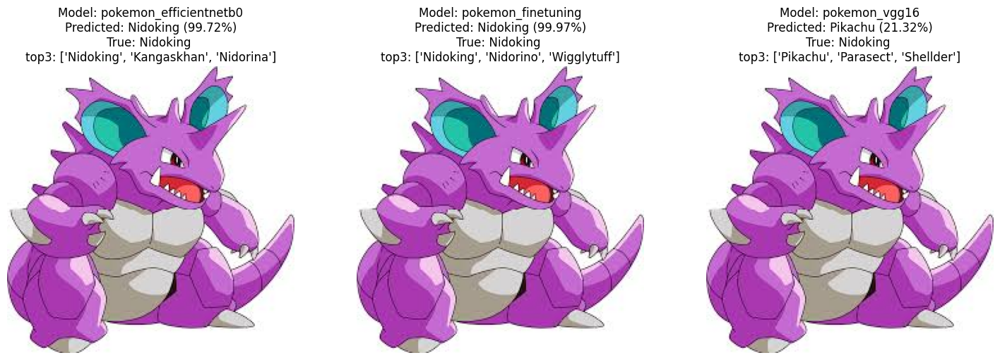


Processing images for class: Pidgeot


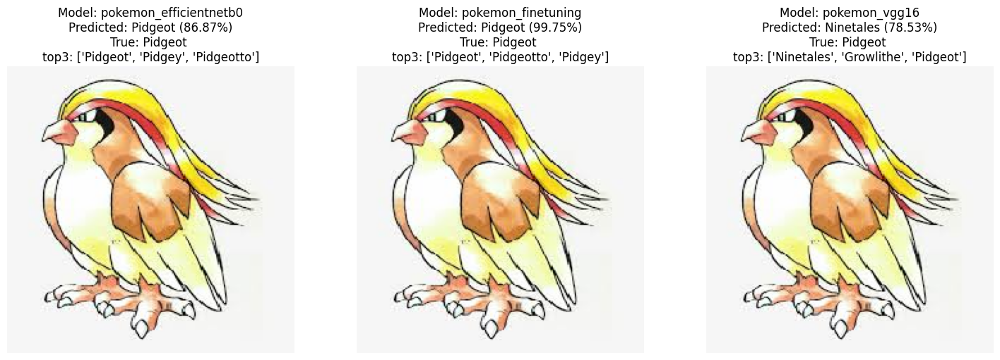

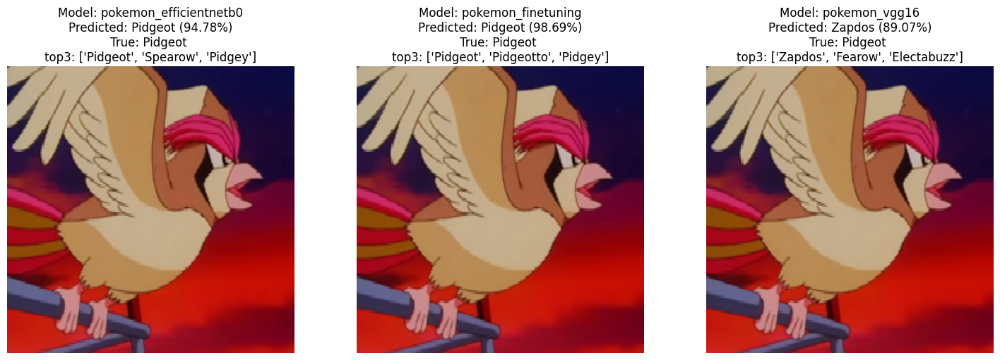


Processing images for class: Exeggutor


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


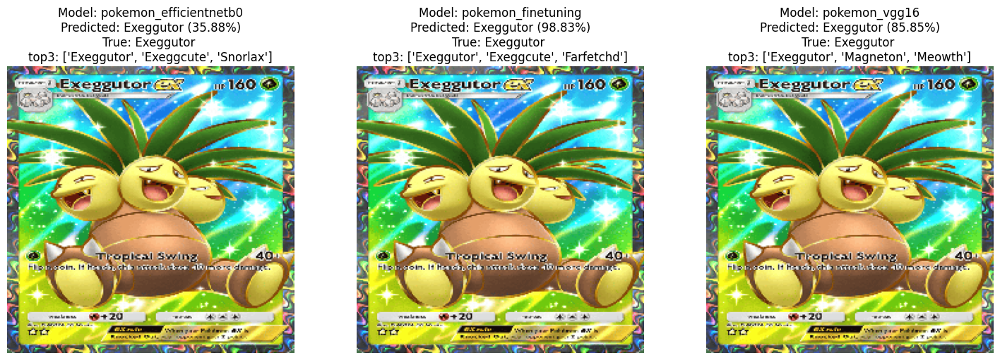

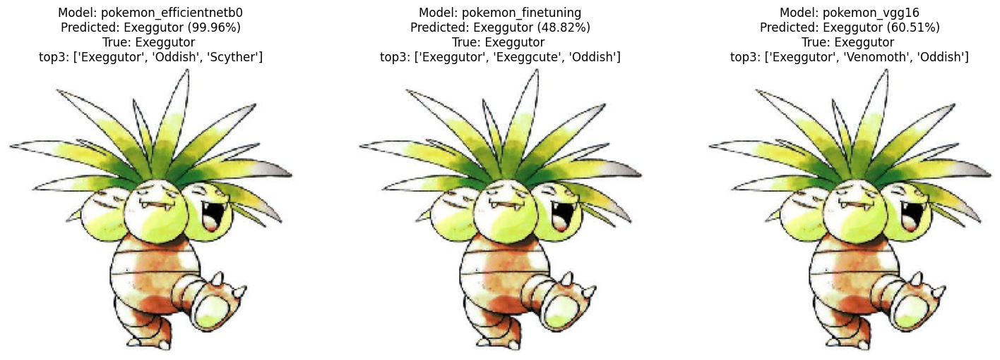


Processing images for class: Machamp


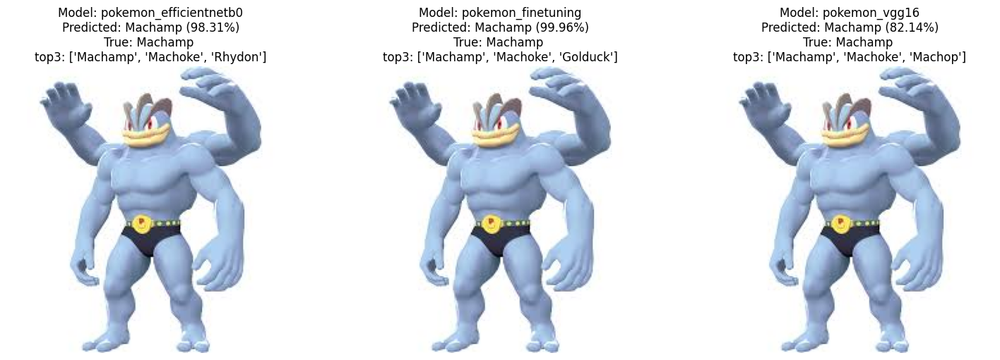

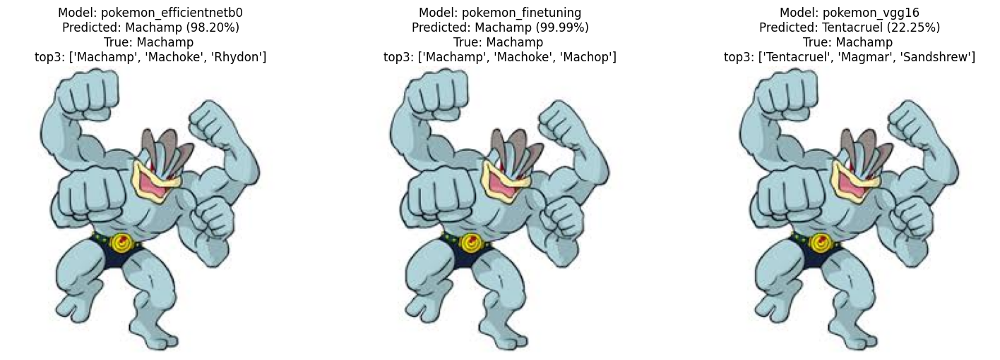


Processing images for class: Alakazam


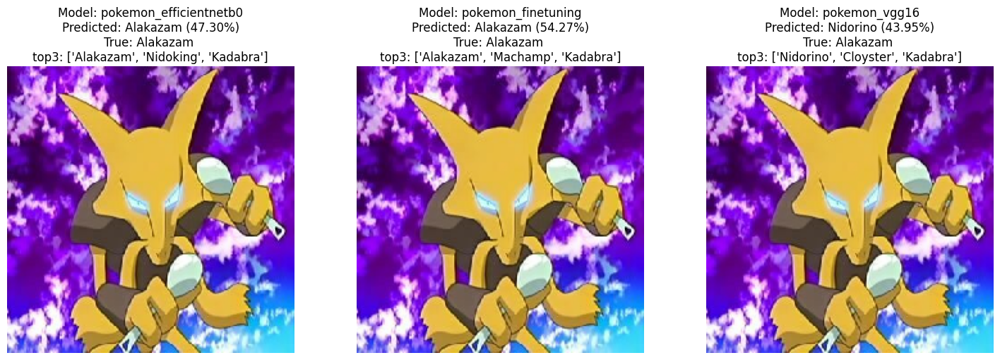

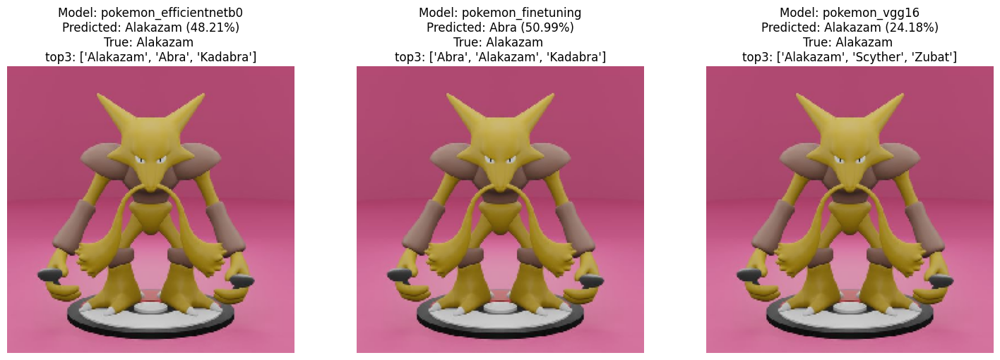


Processing images for class: Arcanine


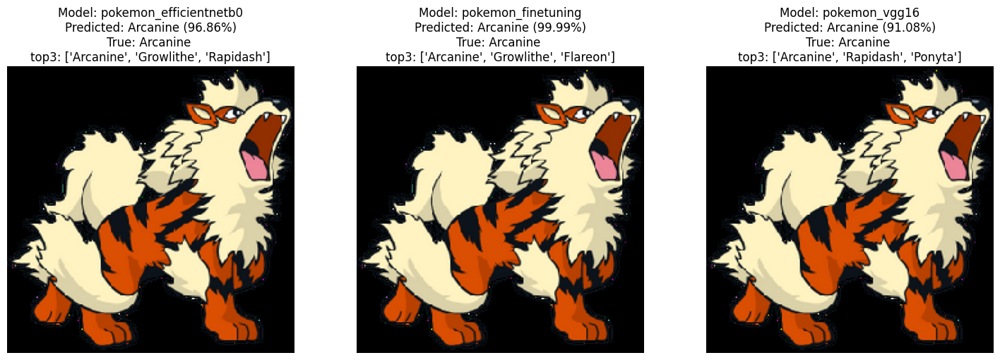

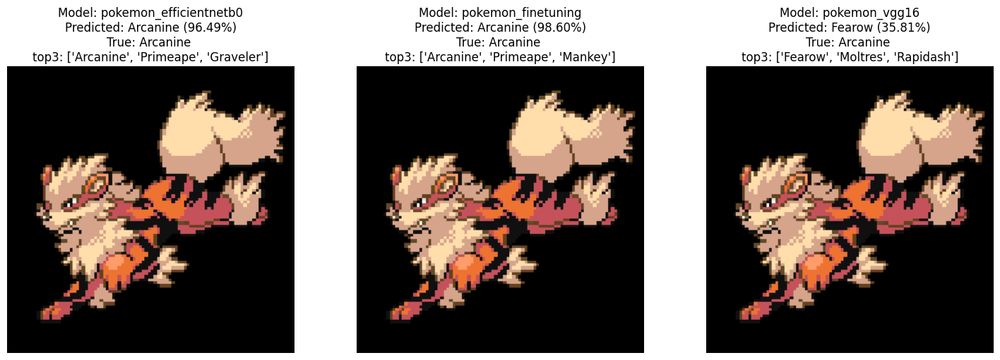


Processing images for class: Lapras


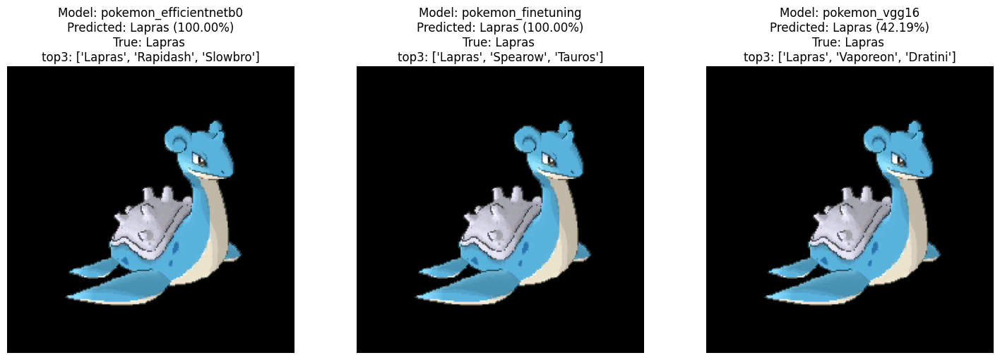

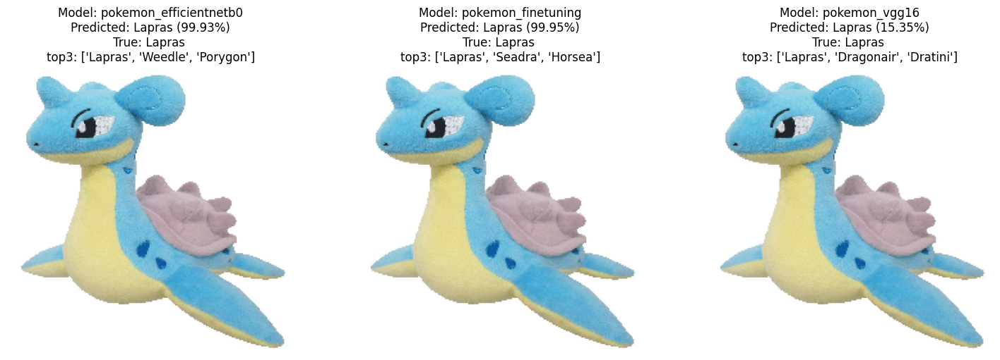


Processing images for class: Jolteon


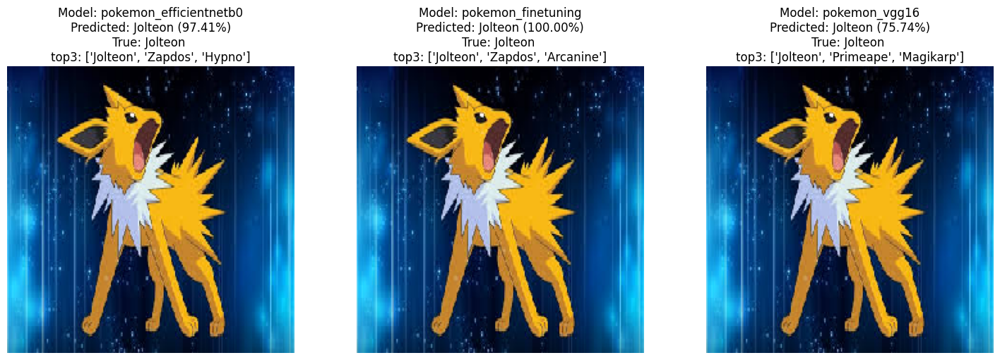

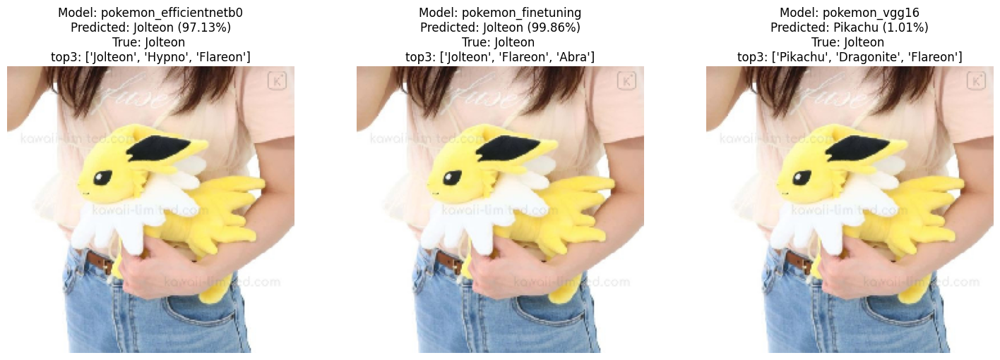

In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.preprocessing.image import load_img, img_to_array
import numpy as np

def run_all_model_predictions_on_images(images_directory, models_directory, class_names, img_size=(224,224)):
    """
    Performs predictions on all images in the specified directory using all
    Keras models found in the models directory, then displays the results
    with each model's prediction for a given image shown side-by-side.

    Args:
        images_directory (str): Path to the base directory containing image class subfolders.
        models_directory (str): Path to the directory containing saved Keras models.
        class_names (list): A list of class names corresponding to model outputs.
        img_size (tuple): The target size (height, width) for image preprocessing.
    """

    # 1. Load all models once to avoid repeated loading and retracing warnings
    loaded_models = {}
    print("Loading models from:", models_directory)
    for model_filename in os.listdir(models_directory):
        if model_filename.endswith('.keras'):
            model_path = os.path.join(models_directory, model_filename)
            try:
                model_name = os.path.splitext(model_filename)[0] # Get model name without extension
                loaded_models[model_name] = tf.keras.models.load_model(model_path)
                print(f"Successfully loaded model: {model_name}")
            except Exception as e:
                print(f"Error loading model {model_filename}: {e}")
    print(f"Finished loading {len(loaded_models)} models.")

    if not loaded_models:
        print("No Keras models found to load. Please ensure models are saved in .keras format.")
        return

    # 2. Iterate through each class folder in the images_directory
    for class_folder in os.listdir(images_directory):
        class_folder_path = os.path.join(images_directory, class_folder)
        if os.path.isdir(class_folder_path):
            true_label = class_folder # The folder name is the true label
            print(f"\nProcessing images for class: {true_label}")

            # 3. Iterate through each image file in the current class folder
            for image_file in os.listdir(class_folder_path):
                # Filter for common image extensions
                if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                    img_path = os.path.join(class_folder_path, image_file)

                    # Load and preprocess the single image once per image
                    img = load_img(img_path, target_size=img_size)
                    img_array = img_to_array(img)
                    img_array = np.expand_dims(img_array, axis=0) # Add batch dimension

                    num_models = len(loaded_models)
                    # Create a single figure with subplots for each model's prediction
                    fig, axes = plt.subplots(1, num_models, figsize=(5 * num_models, 5))

                    # Ensure axes is iterable even if there's only one model
                    if num_models == 1:
                        axes = [axes]

                    # 4. For each image, iterate through all loaded models and make predictions
                    for i, (model_name, current_model) in enumerate(loaded_models.items()):
                        predictions = current_model.predict(img_array, verbose=0)
                        predicted_class_index = np.argmax(predictions[0])
                        predicted_class_name = class_names[predicted_class_index]
                        confidence = 100 * np.max(predictions[0])
                        top_k_indices = np.argsort(predictions[0])[-3:][::-1]
                        top_k_classes = [class_names[i] for i in top_k_indices]

                        # Display the image and prediction results in the current subplot
                        ax = axes[i]
                        ax.imshow(img)
                        ax.axis("off")
                        ax.set_title(f"Model: {model_name}\nPredicted: {predicted_class_name} ({confidence:.2f}%)\nTrue: {true_label} \ntop3: {top_k_classes}")

                    plt.tight_layout()
                    plt.show()

# Example call to the function using variables defined in previous cells
run_all_model_predictions_on_images(IMAGES_DIRECTORY, '/content/models/', class_names, IMAGE_SIZE)
